## Assignment 4

**Task 1**: Object Detectction Metrics

**a)**Intersection over Union (IoU) is an evaluation metric used to evaluate the performance of object detection by comparing the ground truth bounding box to the preddicted bounding box. The intersection over Union is: 

$$
\begin{equation}
IoU = \frac{Area_of_Overlap}{Area_of_Union}
\end{equation}
\tag{1}
$$

To give an example we will use the following picture: 

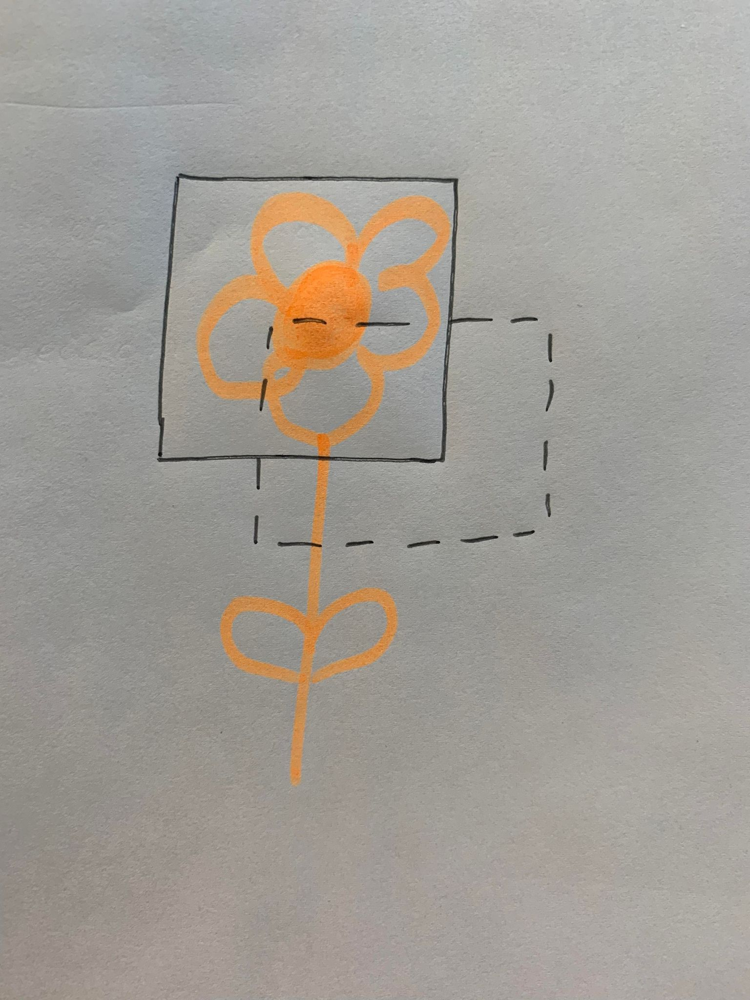

Here the dashed line is the predicted box and the full line is the ground truth box. The intersection will then be given as the following: 

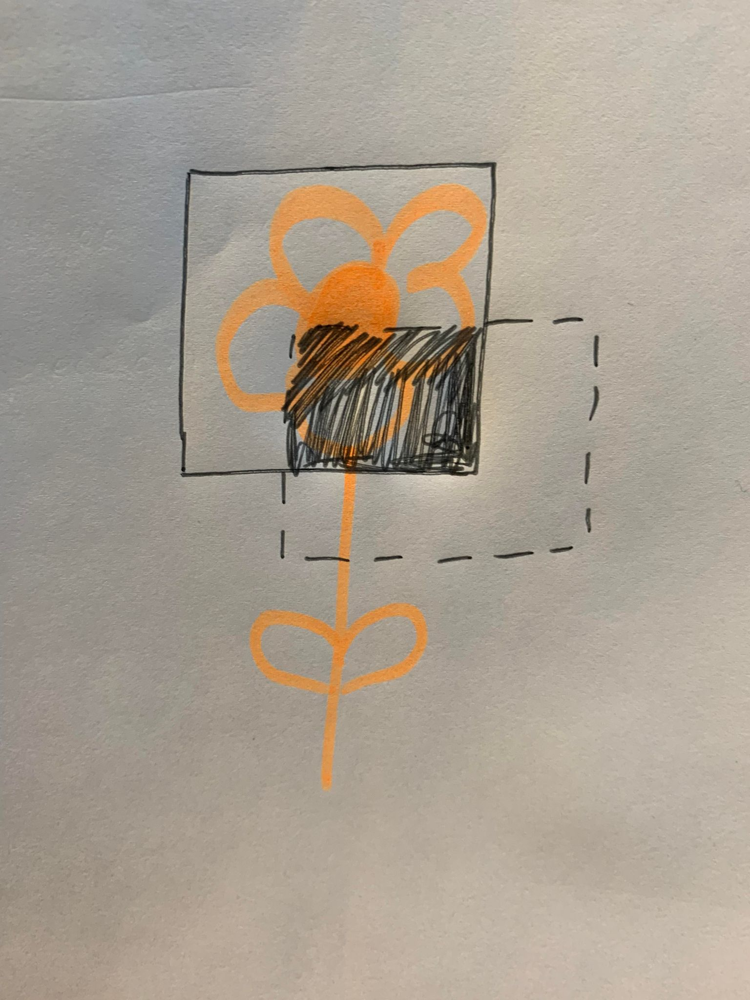

And the Union will then be:
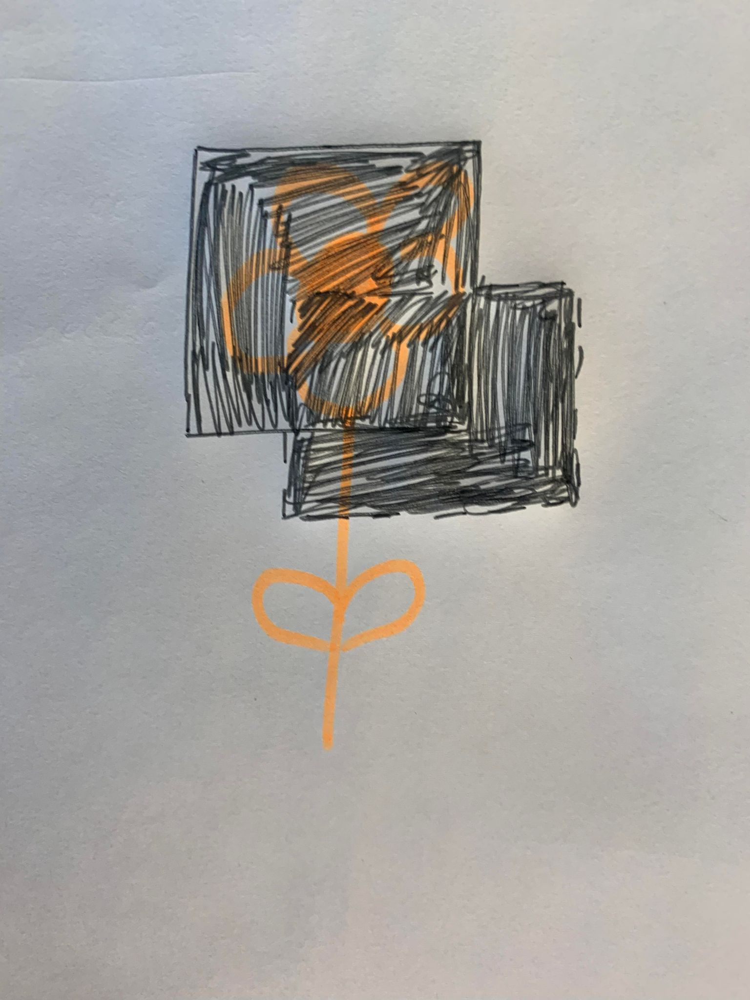

**b)** 

Precision measures the accuracy of our predictions and is defined as

$$
\begin{equation}
Precision = \frac{TP}{TP + FP}.
\end{equation}
\tag{2}
$$

Recall measures how good we are at finding the positives. The percentage of positives found of all our positives. 

$$
\begin{equation}
Recall = \frac{TP}{TP + FN}.
\end{equation}
\tag{3}
$$

A true positive is a correct positiv prediction, while a false positive is an incorrect positive prediction.


**c)** The average precision is the area under the precision-recall curve. 




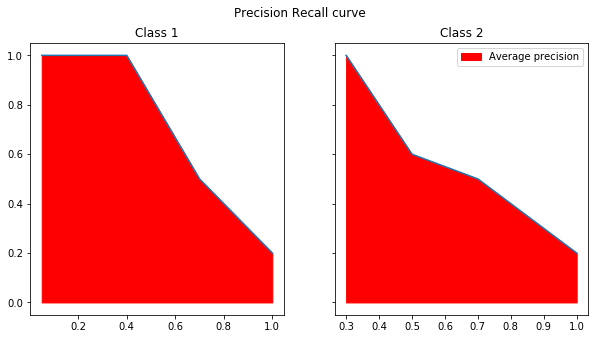

In [12]:
import matplotlib.pyplot as plt

#Class 1
Precision1 = [1.0, 1.0, 1.0, 0.5, 0.20]
Recall1 = [0.05, 0.1, 0.4, 0.7, 1.0]

#Class 2
Precision2 = [1.0, 0.80, 0.60, 0.5, 0.20]
Recall2 = [0.3, 0.4, 0.5, 0.7, 1.0]


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5),sharey = True)
ax1.plot(Recall1, Precision1)
ax1.set_title("Class 1")
ax1.fill_between(Recall1, Precision1, color = "r",label = "Average precision")

ax2.plot(Recall2, Precision2)
ax2.set_title("Class 2")
ax2.fill_between(Recall2, Precision2, color = "r",label = "Average precision")


fig.suptitle("Precision Recall curve")
plt.legend()
plt.show()

It can be defined as the following: 
$$
\begin{equation}
AP = \frac{1}{11} \sum{precision(recall)}, recall = [0.0, 0.1, 0.2, ... , 1.0]
\end{equation}
\tag{4}
$$

To solve this for the problem above, scipy interpolate has been used to create an interpolated function which can then be used in calculating the precision at the given recall values. 

In [19]:
from scipy import interpolate
import numpy as np
precision1_interpolated = interpolate.interp1d(Precision1, Recall1, bounds_error = False, fill_value = 1)
precision2_interpolated = interpolate.interp1d(Precision2, Recall2, bounds_error = False, fill_value = 1)

def average_precision(f):
    av = 0
    recall = np.arange(0,1.1,0.1)
    for r in recall:
        av += f(r)
    return av/11

average_precision_1 = average_precision(precision1_interpolated)
average_precision_2 = average_precision(precision2_interpolated)

print(f"The average precision for class 1 is {average_precision_1}")
print(f"The average precision for class 2 is {average_precision_2}")
print(f"The mean average precision is then {(average_precision_1 + average_precision_2)/2}")

The average precision for class 1 is 0.6636363636363636
The average precision for class 2 is 0.6727272727272727
The mean average precision is then 0.6681818181818182


**Task 2** Implementing Mean Average Precision